In [ ]:
!pip install backtesting
!wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
!tar -xzvf ta-lib-0.4.0-src.tar.gz
%cd ta-lib
!./configure --prefix=/usr
!make
!make install
!pip install Ta-Lib
import talib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
--2023-02-08 16:10:12--  http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
Resolving prdownloads.sourceforge.net (prdownloads.sourceforge.net)... 204.68.111.105
Connecting to prdownloads.sourceforge.net (prdownloads.sourceforge.net)|204.68.111.105|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: http://downloads.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz [following]
--2023-02-08 16:10:12--  http://downloads.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz
Resolving downloads.sourceforge.net (downloads.sourceforge.net)... 204.68.111.105
Reusing existing connection to prdownloads.sourceforge.net:80.
HTTP request sent, awaiting response... 302 Found
Location: http://gigenet.dl.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz [following]
--2023-02-08 16:10:12--  http://gigen

In [ ]:
import sys
import ast
print(sys.executable)
import os
import random
import networkx as nx
from matplotlib import pyplot as plt
import pylab
import re
import torch
import numpy as np
import pandas as pd

/usr/bin/python3


In [ ]:
import requests

def download_file_from_google_drive(id, destination):
    URL = "https://docs.google.com/uc?export=download"

    session = requests.Session()

    response = session.get(URL, params = { 'id' : id }, stream = True)
    token = get_confirm_token(response)

    if token:
        params = { 'id' : id, 'confirm' : token }
        response = session.get(URL, params = params, stream = True)

    save_response_content(response, destination)    

def get_confirm_token(response):
    for key, value in response.cookies.items():
        if key.startswith('download_warning'):
            return value

    return None

def save_response_content(response, destination):
    CHUNK_SIZE = 32768

    with open(destination, "wb") as f:
        for chunk in response.iter_content(CHUNK_SIZE):
            if chunk: # filter out keep-alive new chunks
                f.write(chunk)
destination = 'ETH_5m_train.csv'
file_id = '1jOpvqY4HoqiBA_gV8X9nK9YPQ9i3d0lI'
download_file_from_google_drive(file_id, destination)


In [ ]:
df_train=pd.read_csv('ETH_5m_train.csv')
df_train.dtypes

Market        object
Time          object
Open         float64
High         float64
Low          float64
Close        float64
Volume       float64
TimeFrame     object
dtype: object

In [ ]:
df_train.Time=df_train.Time.astype('datetime64[ns]')

df_train.set_index('Time')

,Market,Open,High,Low,Close,Volume,TimeFrame
Time,,,,,,,
2021-11-25 08:45:00,ETH/USDT:USDT,4295.10,4296.70,4292.65,4292.65,173.06,5m
2021-11-25 08:50:00,ETH/USDT:USDT,4292.65,4295.70,4291.60,4292.65,109.13,5m
2021-11-25 08:55:00,ETH/USDT:USDT,4292.65,4294.80,4289.25,4289.25,71.09,5m
2021-11-25 09:00:00,ETH/USDT:USDT,4289.25,4289.25,4281.95,4288.00,513.73,5m
2021-11-25 09:05:00,ETH/USDT:USDT,4288.00,4288.05,4281.05,4284.60,341.51,5m
...,...,...,...,...,...,...,...
2022-05-26 20:15:00,ETH/USDT:USDT,1813.75,1820.50,1810.75,1818.25,1790.11,5m
2022-05-26 20:20:00,ETH/USDT:USDT,1818.25,1818.75,1811.60,1814.35,999.49,5m
2022-05-26 20:25:00,ETH/USDT:USDT,1814.35,1833.70,1814.10,1833.30,2706.72,5m


In [ ]:

df_train.dtypes

Market               object
Time         datetime64[ns]
Open                float64
High                float64
Low                 float64
Close               float64
Volume              float64
TimeFrame            object
dtype: object

In [ ]:
df_train2 = df_train.drop(['Market','TimeFrame'], axis=1)
df_train2.index


RangeIndex(start=0, stop=52559, step=1)

In [ ]:
df_train2

,Time,Open,High,Low,Close,Volume
0,2021-11-25 08:45:00,4295.10,4296.70,4292.65,4292.65,173.06
1,2021-11-25 08:50:00,4292.65,4295.70,4291.60,4292.65,109.13
2,2021-11-25 08:55:00,4292.65,4294.80,4289.25,4289.25,71.09
3,2021-11-25 09:00:00,4289.25,4289.25,4281.95,4288.00,513.73
4,2021-11-25 09:05:00,4288.00,4288.05,4281.05,4284.60,341.51
...,...,...,...,...,...,...
52554,2022-05-26 20:15:00,1813.75,1820.50,1810.75,1818.25,1790.11
52555,2022-05-26 20:20:00,1818.25,1818.75,1811.60,1814.35,999.49
52556,2022-05-26 20:25:00,1814.35,1833.70,1814.10,1833.30,2706.72
52557,2022-05-26 20:30:00,1833.30,1836.85,1821.95,1825.15,2280.08


In [ ]:


# Example OHLC daily data for Google Inc.
from backtesting.test import GOOG,EURUSD
import math
import warnings
import torch
import torch.nn as nn

In [ ]:
import pandas as pd
import numpy as np


def SMA(values, n):
    """
    Return simple moving average of `values`, at
    each step taking into account `n` previous values.
    """
    return pd.Series(values).rolling(n).mean()

In [ ]:
from backtesting import Strategy
from backtesting.lib import crossover


class SmaCross(Strategy):
    # Define the two MA lags as *class variables*
    # for later optimization
    n1 = 10
    n2 = 20
    
    def init(self):
        # Precompute the two moving averages
        self.sma1 = self.I(SMA, self.data.Close, self.n1)
        self.sma2 = self.I(SMA, self.data.Close, self.n2)
    
    def next(self):
        # If sma1 crosses above sma2, close any existing
        # short trades, and buy the asset
        if crossover(self.sma1, self.sma2):
            self.position.close()
            self.buy()

        # Else, if sma1 crosses below sma2, close any existing
        # long trades, and sell the asset
        elif crossover(self.sma2, self.sma1):
            self.position.close()
            self.sell()

In [ ]:
from backtesting import Strategy
from backtesting.lib import crossover


class shittyOB(Strategy):
    # Define the two MA lags as *class variables*
    # for later optimization
    n1 = 10
    n2 = 20
    
    def init(self):
        # Precompute the two moving averages
        self.sma1 = self.I(SMA, self.data.Close, self.n1)
        self.sma2 = self.I(SMA, self.data.Close, self.n2)
    
    def next(self):
        # If sma1 crosses above sma2, close any existing
        # short trades, and buy the asset
        if crossover(self.sma1, self.sma2):
            self.position.close()
            self.buy()

        # Else, if sma1 crosses below sma2, close any existing
        # long trades, and sell the asset
        elif crossover(self.sma2, self.sma1):
            self.position.close()
            self.sell()

In [ ]:
from backtesting import Backtest

bt = Backtest(df_train, SmaCross, cash=10000, commission=.002)
stats = bt.run()
stats

<ipython-input-124-d17f348d1afd>:3: UserWarning: Data index is not datetime. Assuming simple periods, but `pd.DateTimeIndex` is advised.
  bt = Backtest(df_train, SmaCross, cash=10000, commission=.002)


Start                                     0.0
End                                   52558.0
Duration                              52558.0
Exposure Time [%]                   36.028083
Equity Final [$]                    1961.6746
Equity Peak [$]                    10861.2944
Return [%]                         -80.383254
Buy & Hold Return [%]               -57.42723
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     NaN
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              0.0
Max. Drawdown [%]                  -82.672934
Avg. Drawdown [%]                   -7.049138
Max. Drawdown Duration                52229.0
Avg. Drawdown Duration            4035.615385
# Trades                               1094.0
Win Rate [%]                        26.508227
Best Trade [%]                      12.053037
Worst Trade [%]                     -7.232336
Avg. Trade [%]                    

In [ ]:


bt.plot()



Row(id='2103', ...)

In [ ]:


%%time

stats = bt.optimize(n1=range(5, 30, 5),
                    n2=range(10, 70, 5),
                    maximize='Equity Final [$]',
                    constraint=lambda param: param.n1 < param.n2)
stats



Backtest.optimize:   0%|          | 0/2 [00:00<?, ?it/s]

CPU times: user 1.37 s, sys: 104 ms, total: 1.48 s
Wall time: 1min 9s


Start                                     0.0
End                                   52558.0
Duration                              52558.0
Exposure Time [%]                   80.787306
Equity Final [$]                     2466.276
Equity Peak [$]                    10765.8272
Return [%]                          -75.33724
Buy & Hold Return [%]               -57.42723
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     NaN
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              0.0
Max. Drawdown [%]                  -79.373604
Avg. Drawdown [%]                  -12.235906
Max. Drawdown Duration                52229.0
Avg. Drawdown Duration                 7488.0
# Trades                               1012.0
Win Rate [%]                        29.249012
Best Trade [%]                      11.667874
Worst Trade [%]                     -5.902372
Avg. Trade [%]                    

In [ ]:
stats._strategy

<Strategy SmaCross(n1=20,n2=50)>

In [ ]:


bt.plot(plot_volume=False, plot_pl=False)



Row(id='2674', ...)

In [ ]:


stats.tail()



Expectancy [%]                                            -0.173489
SQN                                                       -3.357029
_strategy                                     SmaCross(n1=20,n2=50)
_equity_curve               Equity  DrawdownPct  DrawdownDuratio...
_trades                 Size  EntryBar  ExitBar  EntryPrice  Exi...
dtype: object

In [ ]:


stats['_equity_curve']  # Contains equity/drawdown curves. DrawdownDuration is only defined at ends of DD periods.



,Equity,DrawdownPct,DrawdownDuration
0,10000.000,0.000000,NaN
1,10000.000,0.000000,NaN
2,10000.000,0.000000,NaN
3,10000.000,0.000000,NaN
4,10000.000,0.000000,NaN
...,...,...,...
52554,2473.176,0.770275,NaN
52555,2477.076,0.769913,NaN
52556,2458.126,0.771673,NaN
52557,2466.276,0.770916,NaN


In [ ]:


stats['_trades']  # Contains individual trade data



,Size,EntryBar,ExitBar,EntryPrice,ExitPrice,PnL,ReturnPct,EntryTime,ExitTime,Duration
0,-2,136,150,4503.0259,4520.05,-34.0482,-0.003781,136,150,14
1,2,150,165,4529.0901,4495.65,-66.8802,-0.007383,150,165,15
2,-2,165,177,4486.6587,4543.45,-113.5826,-0.012658,165,177,12
3,2,177,205,4552.5369,4497.00,-111.0738,-0.012199,177,205,28
4,-2,205,351,4488.0060,4085.90,804.2120,0.089596,205,351,146
...,...,...,...,...,...,...,...,...,...,...
1007,-1,52271,52296,1951.8884,1964.10,-12.2116,-0.006256,52271,52296,25
1008,1,52296,52308,1968.0282,1941.35,-26.6782,-0.013556,52296,52308,12
1009,-1,52308,52490,1937.4673,1847.00,90.4673,0.046694,52308,52490,182
1010,1,52490,52539,1850.6940,1861.00,10.3060,0.005569,52490,52539,49


In [ ]:
tradeRecord=None
for row in stats['_trades'].iterrows():
    print(row)
    break

(0, Size            -2.000000
EntryBar       136.000000
ExitBar        150.000000
EntryPrice    4503.025900
ExitPrice     4520.050000
PnL            -34.048200
ReturnPct       -0.003781
EntryTime      136.000000
ExitTime       150.000000
Duration        14.000000
Name: 0, dtype: float64)


In [ ]:
stats['_trades']

,Size,EntryBar,ExitBar,EntryPrice,ExitPrice,PnL,ReturnPct,EntryTime,ExitTime,Duration
0,-2,136,150,4503.0259,4520.05,-34.0482,-0.003781,136,150,14
1,2,150,165,4529.0901,4495.65,-66.8802,-0.007383,150,165,15
2,-2,165,177,4486.6587,4543.45,-113.5826,-0.012658,165,177,12
3,2,177,205,4552.5369,4497.00,-111.0738,-0.012199,177,205,28
4,-2,205,351,4488.0060,4085.90,804.2120,0.089596,205,351,146
...,...,...,...,...,...,...,...,...,...,...
1007,-1,52271,52296,1951.8884,1964.10,-12.2116,-0.006256,52271,52296,25
1008,1,52296,52308,1968.0282,1941.35,-26.6782,-0.013556,52296,52308,12
1009,-1,52308,52490,1937.4673,1847.00,90.4673,0.046694,52308,52490,182
1010,1,52490,52539,1850.6940,1861.00,10.3060,0.005569,52490,52539,49


In [ ]:
trade_stat=stats['_trades'].copy()

train_stat=trade_stat[(trade_stat.Size>0) &( trade_stat.EntryBar>50) ].copy()
train_stat

,Size,EntryBar,ExitBar,EntryPrice,ExitPrice,PnL,ReturnPct,EntryTime,ExitTime,Duration
1,2,150,165,4529.0901,4495.65,-66.8802,-0.007383,150,165,15
3,2,177,205,4552.5369,4497.00,-111.0738,-0.012199,177,205,28
5,2,351,382,4094.0718,4071.65,-44.8436,-0.005477,351,382,31
7,2,399,405,4082.1981,4036.00,-92.3962,-0.011317,399,405,6
9,2,427,461,4074.0819,4076.95,5.7362,0.000704,427,461,34
...,...,...,...,...,...,...,...,...,...,...
1002,1,52053,52094,2003.4489,1984.95,-18.4989,-0.009234,52053,52094,41
1004,1,52192,52221,1978.7496,1949.45,-29.2996,-0.014807,52192,52221,29
1006,1,52246,52271,1981.5552,1955.80,-25.7552,-0.012997,52246,52271,25
1008,1,52296,52308,1968.0282,1941.35,-26.6782,-0.013556,52296,52308,12


In [ ]:
train_stat

,Size,EntryBar,ExitBar,EntryPrice,ExitPrice,PnL,ReturnPct,EntryTime,ExitTime,Duration
1,2,150,165,4529.0901,4495.65,-66.8802,-0.007383,150,165,15
3,2,177,205,4552.5369,4497.00,-111.0738,-0.012199,177,205,28
5,2,351,382,4094.0718,4071.65,-44.8436,-0.005477,351,382,31
7,2,399,405,4082.1981,4036.00,-92.3962,-0.011317,399,405,6
9,2,427,461,4074.0819,4076.95,5.7362,0.000704,427,461,34
...,...,...,...,...,...,...,...,...,...,...
1002,1,52053,52094,2003.4489,1984.95,-18.4989,-0.009234,52053,52094,41
1004,1,52192,52221,1978.7496,1949.45,-29.2996,-0.014807,52192,52221,29
1006,1,52246,52271,1981.5552,1955.80,-25.7552,-0.012997,52246,52271,25
1008,1,52296,52308,1968.0282,1941.35,-26.6782,-0.013556,52296,52308,12


In [ ]:
tradeRecord=[]
tradeResult=(train_stat.PnL/abs(train_stat.PnL)+1)/2
for idx,row in train_stat.iterrows():
  timestamp=row['EntryTime']
  df=df_train.iloc[df_train.index.get_loc(timestamp)-40:df_train.index.get_loc(timestamp)].copy()
  #print(type(talib.ATR(df['High'],df['Low'],df['Close'],timeperiod=5).last(1)))
  atr=(talib.ATR(df['High'],df['Low'],df['Close'],timeperiod=10)).values[-1]
  maxP=max(df['High'])
  minP=min(df['Low'])

  df['Open']=(df['Open']-minP-(maxP-minP)/2)/atr
  df['High']=(df['High']-minP-(maxP-minP)/2)/atr
  df['Low']=(df['Low']-minP-(maxP-minP)/2)/atr
  df['Close']=(df['Close']-minP-(maxP-minP)/2)/atr
  tradeRecord.append([df.High.values.tolist(),df.Low.values.tolist()])



len(tradeRecord)

501

In [ ]:
from sklearn.utils import resample

from sklearn.model_selection import train_test_split
data = {'tradeRecord': tradeRecord, 'tradeResult': tradeResult}

# Convert the dictionary into a dataframe
df = pd.DataFrame(data)

X = df.drop("tradeResult", axis=1)
y = df["tradeResult"]

# Split the data into training and testing sets
tradeRecord, testRecord, tradeResult, testResult = train_test_split(X, y, test_size=0.2, random_state=0)

testRecord=testRecord["tradeRecord"].tolist()
tradeRecord=tradeRecord["tradeRecord"].tolist()

testRecord=torch.tensor(testRecord).float()
testResult=torch.tensor(testResult.values.tolist()).float()


data = {'tradeRecord': tradeRecord, 'tradeResult': tradeResult}

# Convert the dictionary into a dataframe
df = pd.DataFrame(data)


# Separate majority and minority classes
df_majority = df[df.tradeResult==0]
df_minority = df[df.tradeResult==1]

# Downsample majority class
df_majority_downsampled = resample(df_majority, 
                                   replace=False,    # sample without replacement
                                   n_samples=len(df_minority),    # to match minority class
                                   random_state=0)   # reproducible results
df_majority_downsampled= df_majority
# Combine minority class with downsampled majority class
df_downsampled = pd.concat([df_majority_downsampled, df_minority])
 
# Display new class counts
print(df_downsampled.tradeResult.value_counts())


tradeRecord=df_downsampled.tradeRecord.tolist()
tradeResult=df_downsampled.tradeResult.tolist()


0.0    277
1.0    122
Name: tradeResult, dtype: int64


In [ ]:
df_downsampled = df_downsampled.sample(frac=1).reset_index(drop=True)

# Print the shuffled dataframe
print(df_downsampled)

                                           tradeRecord  tradeResult
0    [[5.017248389119808, 3.902304302648786, 3.0637...          0.0
1    [[1.4824479728254383, 1.9784342834361865, 0.77...          0.0
2    [[4.01718539914006, 3.996964667265182, 3.81497...          0.0
3    [[2.019603773431235, 2.5079258798429334, 1.814...          0.0
4    [[4.036463075905918, 3.6050402288471504, 3.392...          1.0
..                                                 ...          ...
394  [[2.7457035928567097, 2.7457035928567097, 1.18...          0.0
395  [[7.76159836031051, 7.473958058538686, 2.53717...          0.0
396  [[3.257087457183756, 2.2784784791528554, 2.545...          1.0
397  [[1.7285182610701613, 3.1723393967876024, 2.83...          1.0
398  [[2.9949131352821188, 3.0220655662456917, 2.89...          0.0

[399 rows x 2 columns]


In [ ]:

trainRecord=torch.tensor(df_downsampled.tradeRecord.tolist()).float()
trainResult=torch.tensor(df_downsampled.tradeResult.tolist()).float() 


In [ ]:
sum(trainResult.tolist())/len(trainResult.tolist())


0.3057644110275689

In [ ]:
trainResult

tensor([0., 0., 0., 0., 1., 0., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0., 0., 1., 0., 0., 0., 1., 1., 0., 0., 0., 0., 1., 1., 0., 0., 0.,
        0., 1., 0., 0., 1., 0., 1., 0., 0., 1., 1., 0., 0., 1., 0., 0., 0., 0.,
        0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0.,
        0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0.,
        1., 0., 0., 0., 0., 1., 1., 1., 0., 0., 0., 1., 0., 0., 0., 0., 1., 1.,
        0., 0., 0., 1., 1., 0., 1., 0., 0., 0., 0., 0., 0., 1., 1., 1., 0., 0.,
        0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0.,
        0., 0., 1., 1., 0., 1., 1., 0., 0., 0., 0., 1., 0., 0., 1., 0., 1., 0.,
        0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        1., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0.,
        1., 0., 0., 1., 0., 1., 1., 0., 1., 1., 0., 0., 0., 1., 0., 0., 0., 0.,
        0., 1., 1., 0., 1., 1., 0., 0., 

In [ ]:
import torch.nn as nn
import torch.nn.functional as F
class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1In,self.conv1Out = 2, 128
        self.conv1 = nn.Conv1d(self.conv1In, self.conv1Out, 3)
        self.pool1=nn.MaxPool1d(3, stride=2)

        self.conv2In,self.conv2Out = self.conv1Out, 128
        self.conv2 = nn.Conv1d(self.conv2In, self.conv2Out, 3)
        self.pool2=nn.MaxPool1d(3, stride=2)
        
        self.lstmHiddenDim,self.lstmIn = 128, self.conv2Out
        self.lstm = nn.LSTM(input_size =self.conv2Out,hidden_size =self.lstmHiddenDim)

        self.fc=nn.Linear(self.lstmHiddenDim, 2)

    def forward(self, x):
        output=x
        output = self.pool1(F.relu(self.conv1(output)))
        output = self.pool2(F.relu(self.conv2(output)))
        output=output.transpose(0, 1)
        output,(h,c)=self.lstm(output)
        result=self.fc(h)
        return result

In [ ]:
import torch.optim as optim
net = Net()
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.00001, momentum=0.1)

In [ ]:
predList=[]
trainLoss=[]
testLoss=[]
lossRecordArray=[]
for epoch in range(50):  # loop over the dataset multiple times
    lossRecordArray.append(epoch+1)
    predList=[]
    running_loss = 0.0
    optimizer.zero_grad()
    for i in range(len(trainRecord)):
        # get the inputs; data is a list of [inputs, labels]
        inputs=trainRecord[i]
        labels =torch.tensor([trainResult[i]]).type(torch.LongTensor)
        # zero the parameter gradients

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        if epoch%30==9:

          #print('Train loss:',loss)
          pass

        # print statistics
        running_loss += loss.item()
    trainLoss.append(running_loss / len(trainRecord))


    if epoch%10==9 or 1==1:
      #print(f'[{epoch + 1}] loss: {running_loss / len(trainRecord):.3f}')
      running_loss = 0.0
      if 1==1:
        correct = 0
        total = 0
        # since we're not training, we don't need to calculate the gradients for our outputs
        with torch.no_grad():
            for i in range(len(trainRecord)):
                # get the inputs; data is a list of [inputs, labels]
                inputs=trainRecord[i]
                labels =torch.tensor([trainResult[i]]).type(torch.LongTensor)
                # calculate outputs by running images through the network
                outputs = net(inputs)
                # the class with the highest energy is what we choose as prediction
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()
                predList.append(predicted.tolist()[0])

        print(f'Accuracy of the network on the {len(trainRecord)} train images: {100 * correct // total} %')
    if 1==1:
      correct = 0
      total = 0
      testloss=0.0
      # since we're not training, we don't need to calculate the gradients for our outputs
      with torch.no_grad():
          for i in range(len(testRecord)):
              # get the inputs; data is a list of [inputs, labels]
              inputs=testRecord[i]
              labels =torch.tensor([testResult[i]]).type(torch.LongTensor)
              # calculate outputs by running images through the network
              outputs = net(inputs)

              loss = criterion(outputs, labels)
              if epoch%30==9:
                #print('Test loss:',loss)
                pass

              # print statistics
              testloss += loss.item()
              # the class with the highest energy is what we choose as prediction
              _, predicted = torch.max(outputs.data, 1)
              total += labels.size(0)
              correct += (predicted == labels).sum().item()
      print(f'Accuracy of the network on the {len(testRecord)} test images: {100 * correct // total} %')

      testLoss.append(testloss / len(testRecord))
print('Finished Training')

Accuracy of the network on the 399 train images: 69 %
Accuracy of the network on the 101 test images: 73 %
Accuracy of the network on the 399 train images: 69 %
Accuracy of the network on the 101 test images: 73 %
Accuracy of the network on the 399 train images: 69 %
Accuracy of the network on the 101 test images: 73 %
Accuracy of the network on the 399 train images: 69 %
Accuracy of the network on the 101 test images: 73 %
Accuracy of the network on the 399 train images: 69 %
Accuracy of the network on the 101 test images: 73 %
Accuracy of the network on the 399 train images: 69 %
Accuracy of the network on the 101 test images: 73 %
Accuracy of the network on the 399 train images: 69 %
Accuracy of the network on the 101 test images: 73 %
Accuracy of the network on the 399 train images: 69 %
Accuracy of the network on the 101 test images: 73 %
Accuracy of the network on the 399 train images: 69 %
Accuracy of the network on the 101 test images: 73 %
Accuracy of the network on the 399 tr

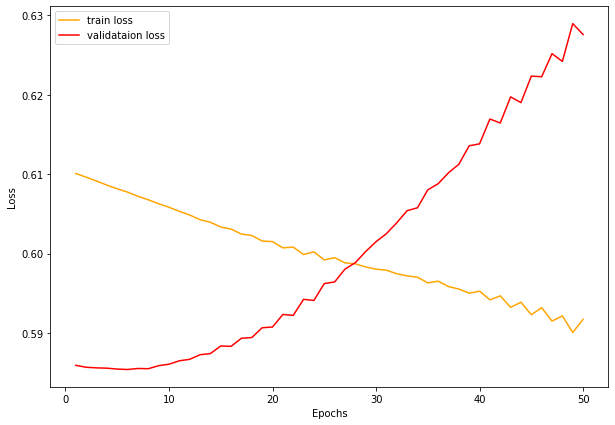

In [ ]:

plt.figure(figsize=(10, 7))
plt.plot(lossRecordArray,trainLoss, color='orange', label='train loss')
plt.plot(lossRecordArray,testLoss, color='red', label='validataion loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [ ]:
pred=[]
correct = 0
total = 0
# since we're not training, we don't need to calculate the gradients for our outputs
with torch.no_grad():
    for i in range(len(testRecord)):
        # get the inputs; data is a list of [inputs, labels]
        inputs=testRecord[i]
        labels =torch.tensor([testResult[i]]).type(torch.LongTensor)
        # calculate outputs by running images through the network
        outputs = net(inputs)
        # the class with the highest energy is what we choose as prediction
        _, predicted = torch.max(outputs.data, 1)
        pred.append(predicted.tolist()[0])
        total += labels.size(0)
        correct += (predicted == labels).sum().item()


print(f'Accuracy of the network on the {len(testRecord)} test images: {100 * correct // total} %')


Accuracy of the network on the 101 test images: 70 %


In [ ]:
sum(testResult)/len(testResult)

tensor(0.2673)

In [ ]:
sum(pred)/len(pred)


0.5346534653465347

In [ ]:
from sklearn.metrics import classification_report
cr = classification_report(testResult.tolist(), pred)
print("Classification report:")
print(cr)

Classification report:
              precision    recall  f1-score   support

         0.0       0.75      0.89      0.81        74
         1.0       0.38      0.19      0.25        27

    accuracy                           0.70       101
   macro avg       0.57      0.54      0.53       101
weighted avg       0.65      0.70      0.66       101



In [ ]:
from sklearn.metrics import confusion_matrix

# Calculate the confusion matrix
cm = confusion_matrix(testResult.tolist(), pred)
print("Confusion matrix:")
print(cm)

Confusion matrix:
[[66  8]
 [22  5]]
